## Loading Libraries

In [104]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import FunctionTransformer, StandardScaler

#Data Visualisation
import matplotlib.pyplot as plt
import seaborn as sns

import warnings
warnings.filterwarnings('ignore')

## Loading Data


In [2]:
df = pd.read_csv('train.csv')

##### Initial Data Review

<hr>

### Descriptive Statistics

In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1201 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   Alley          91 non-null     object 
 7   LotShape       1460 non-null   object 
 8   LandContour    1460 non-null   object 
 9   Utilities      1460 non-null   object 
 10  LotConfig      1460 non-null   object 
 11  LandSlope      1460 non-null   object 
 12  Neighborhood   1460 non-null   object 
 13  Condition1     1460 non-null   object 
 14  Condition2     1460 non-null   object 
 15  BldgType       1460 non-null   object 
 16  HouseStyle     1460 non-null   object 
 17  OverallQual    1460 non-null   int64  
 18  OverallC

In [4]:
df.describe()

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,...,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
count,1460.000000,1460.000000,1201.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1452.000000,1460.000000,...,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000
mean,730.500000,56.897260,70.049958,10516.828082,6.099315,5.575342,1971.267808,1984.865753,103.685262,443.639726,...,94.244521,46.660274,21.954110,3.409589,15.060959,2.758904,43.489041,6.321918,2007.815753,180921.195890
std,421.610009,42.300571,24.284752,9981.264932,1.382997,1.112799,30.202904,20.645407,181.066207,456.098091,...,125.338794,66.256028,61.119149,29.317331,55.757415,40.177307,496.123024,2.703626,1.328095,79442.502883
min,1.000000,20.000000,21.000000,1300.000000,1.000000,1.000000,1872.000000,1950.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,34900.000000
25%,365.750000,20.000000,59.000000,7553.500000,5.000000,5.000000,1954.000000,1967.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000,2007.000000,129975.000000
50%,730.500000,50.000000,69.000000,9478.500000,6.000000,5.000000,1973.000000,1994.000000,0.000000,383.500000,...,0.000000,25.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000,163000.000000
75%,1095.250000,70.000000,80.000000,11601.500000,7.000000,6.000000,2000.000000,2004.000000,166.000000,712.250000,...,168.000000,68.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000,214000.000000
max,1460.000000,190.000000,313.000000,215245.000000,10.000000,9.000000,2010.000000,2010.000000,1600.000000,5644.000000,...,857.000000,547.000000,552.000000,508.000000,480.000000,738.000000,15500.000000,12.000000,2010.000000,755000.000000


In [5]:
df.shape

(1460, 81)

---

## Data Description

- **SalePrice** - the property's sale price in dollars. This is the target variable
- **MSSubClass** - The building class
- **MSZoning** - The general zoning classification
- **LotFrontage** - Linear feet of street connected to property
- **LotArea** - Lot size in square feet
- **Street** - Type of road access
- **Alley** - Type of alley access
- **LotShape** - General shape of property
- **LandContour** - Flatness of the property
- **Utilities** - Type of utilities available
- **LotConfig** - Lot configuration
- **LandSlope** - Slope of property
- **Neighborhood** - Physical locations within Ames city limits
- **Condition1** - Proximity to main road or railroad
- **Condition2** - Proximity to main road or railroad (if a second is present)
- **BldgType** - Type of dwelling
- **HouseStyle** - Style of dwelling
- **OverallQual** - Overall material and finish quality
- **OverallCond** - Overall condition rating
- **YearBuilt** - Original construction date
- **YearRemodAdd** - Remodel date
- **RoofStyle** - Type of roof
- **RoofMatl** - Roof material
- **Exterior1st** - Exterior covering on house
- **Exterior2nd** - Exterior covering on house (if more than one material)
- **MasVnrType** - Masonry veneer type
- **MasVnrArea** - Masonry veneer area in square feet
- **ExterQual** - Exterior material quality
- **ExterCond** - Present condition of the material on the exterior
- **Foundation** - Type of foundation
- **BsmtQual** - Height of the basement
- **BsmtCond** - General condition of the basement
- **BsmtExposure** - Walkout or garden level basement walls
- **BsmtFinType1** - Quality of basement finished area
- **BsmtFinSF1** - Type 1 finished square feet
- **BsmtFinType2** - Quality of second finished area (if present)
- **BsmtFinSF2** - Type 2 finished square feet
- **BsmtUnfSF** - Unfinished square feet of basement area
- **TotalBsmtSF** - Total square feet of basement area
- **Heating** - Type of heating
- **HeatingQC** - Heating quality and condition
- **CentralAir** - Central air conditioning
- **Electrical** - Electrical system
- **1stFlrSF** - First Floor square feet
- **2ndFlrSF** - Second floor square feet
- **LowQualFinSF** - Low quality finished square feet (all floors)
- **GrLivArea** - Above grade (ground) living area square feet
- **BsmtFullBath** - Basement full bathrooms
- **BsmtHalfBath** - Basement half bathrooms
- **FullBath** - Full bathrooms above grade
- **HalfBath** - Half baths above grade
- **BedroomAbvGr** - Number of bedrooms above basement level
- **KitchenAbvGr** - Number of kitchens
- **KitchenQual** - Kitchen quality
- **TotRmsAbvGrd** - Total rooms above grade (does not include bathrooms)
- **Functional** - Home functionality rating
- **Fireplaces** - Number of fireplaces
- **FireplaceQu** - Fireplace quality
- **GarageType** - Garage location
- **GarageYrBlt** - Year garage was built
- **GarageFinish** - Interior finish of the garage
- **GarageCars** - Size of garage in car capacity
- **GarageArea** - Size of garage in square feet
- **GarageQual** - Garage quality
- **GarageCond** - Garage condition
- **PavedDrive** - Paved driveway
- **WoodDeckSF** - Wood deck area in square feet
- **OpenPorchSF** - Open porch area in square feet
- **EnclosedPorch** - Enclosed porch area in square feet
- **3SsnPorch** - Three season porch area in square feet
- **ScreenPorch** - Screen porch area in square feet
- **PoolArea** - Pool area in square feet
- **PoolQC** - Pool quality
- **Fence** - Fence quality
- **MiscFeature** - Miscellaneous feature not covered in other categories
- **MiscVal** - $Value of miscellaneous feature
- **MoSold** - Month Sold
- **YrSold** - Year Sold
- **SaleType** - Type of sale
- **SaleCondition** - Condition of sale

---

In [6]:
df

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,1456,60,RL,62.0,7917,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,8,2007,WD,Normal,175000
1456,1457,20,RL,85.0,13175,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,MnPrv,NaN,0,2,2010,WD,Normal,210000
1457,1458,70,RL,66.0,9042,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,GdPrv,Shed,2500,5,2010,WD,Normal,266500
1458,1459,20,RL,68.0,9717,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,4,2010,WD,Normal,142125


## IDR


In [7]:
df.columns

Index(['Id', 'MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'Street',
       'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig',
       'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType',
       'HouseStyle', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd',
       'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType',
       'MasVnrArea', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual',
       'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1',
       'BsmtFinType2', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'Heating',
       'HeatingQC', 'CentralAir', 'Electrical', '1stFlrSF', '2ndFlrSF',
       'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath',
       'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual',
       'TotRmsAbvGrd', 'Functional', 'Fireplaces', 'FireplaceQu', 'GarageType',
       'GarageYrBlt', 'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual',
       'GarageCond', 'PavedDrive

In [8]:
df.drop(columns=['Id'],inplace=True)

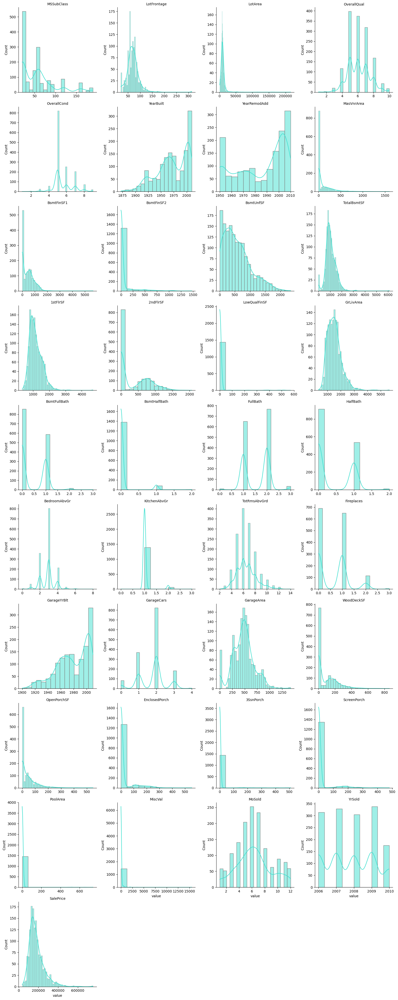

In [9]:
df_melt = df.select_dtypes(include=[np.number]).melt()
g = sns.FacetGrid(df_melt, col="variable", col_wrap=4, height=4, sharex=False, sharey=False)
g.map(sns.histplot, "value", color="turquoise",kde=True,edgecolor="grey")
g.set_titles("{col_name}")
plt.show()

#### Key Notes of Initial Data Review
- Columns such as SalePrice, GrLivArea, LotArea appears to be left skewed (Note to be normalised or standardised)
- Several categorical columns need encoding
- Missing values present in multiple columns

In [10]:
df.isna().sum()

MSSubClass         0
MSZoning           0
LotFrontage      259
LotArea            0
Street             0
                ... 
MoSold             0
YrSold             0
SaleType           0
SaleCondition      0
SalePrice          0
Length: 80, dtype: int64

## EDA | Exploratory Data Analysis

In [11]:
df_melt = df.select_dtypes(include=[np.number]).melt(id_vars='SalePrice')

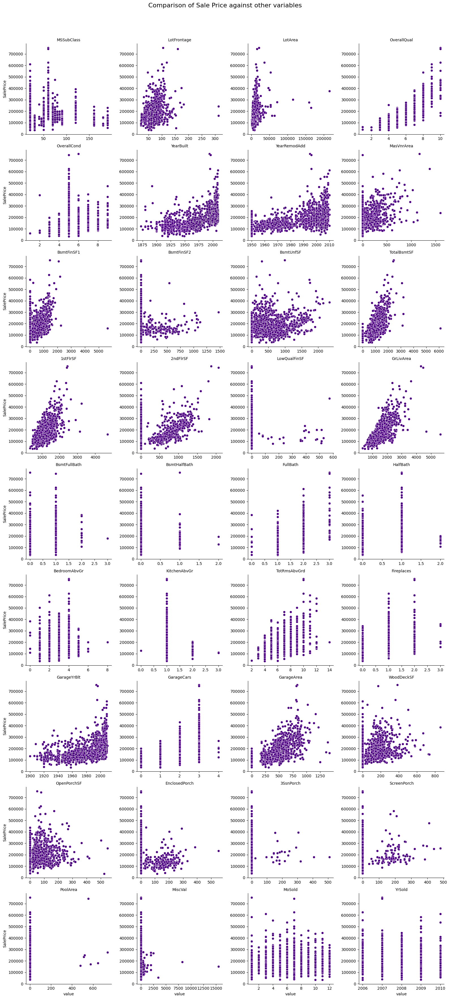

In [12]:
g = sns.FacetGrid(df_melt, col="variable", col_wrap=4, height=4, sharex=False, sharey=False)
g.map(sns.scatterplot,"value","SalePrice", color="indigo")
g.set_titles("{col_name}")
plt.subplots_adjust(top=0.94) 
g.figure.suptitle("Comparison of Sale Price against other variables", fontsize=16)
plt.show()

### Key Notes
- GrLivArea, OverallQual, TotalBsmtSF show strong positive relationship with SalePrice
- Several features show correlation patterns worth exploring
- Categorical variables need encoding

In [13]:
df.columns

Index(['MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'Street', 'Alley',
       'LotShape', 'LandContour', 'Utilities', 'LotConfig', 'LandSlope',
       'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 'HouseStyle',
       'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd', 'RoofStyle',
       'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'MasVnrArea',
       'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond',
       'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1', 'BsmtFinType2',
       'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'Heating', 'HeatingQC',
       'CentralAir', 'Electrical', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF',
       'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath',
       'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual', 'TotRmsAbvGrd',
       'Functional', 'Fireplaces', 'FireplaceQu', 'GarageType', 'GarageYrBlt',
       'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual', 'GarageCond',
       'PavedDrive', 'Wo

## Data Preprocessing

### Feature Cleaning

<Axes: >

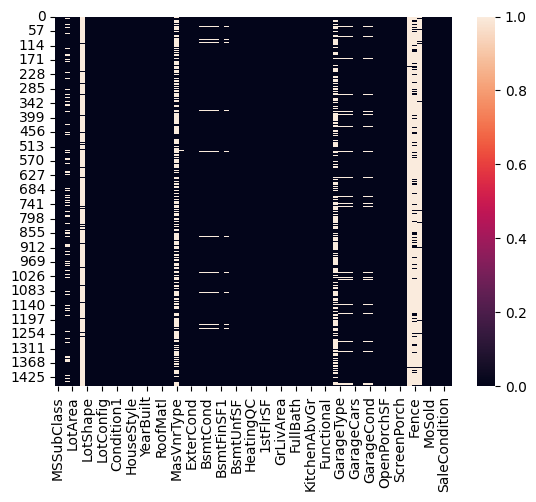

In [14]:
sns.heatmap(df.isna())

In [15]:
df.isna().sum()

MSSubClass         0
MSZoning           0
LotFrontage      259
LotArea            0
Street             0
                ... 
MoSold             0
YrSold             0
SaleType           0
SaleCondition      0
SalePrice          0
Length: 80, dtype: int64

In [16]:
for column in df.columns[df.isna().any()]:
    if df[column].dtype != 'object':
        skew = df[column].skew()
        if skew <= 2 and skew >= -2 :
            print(f'{column} skewness : {df[column].skew():.2f} : Mean')
        else:
            print(f'{column} skewness : {df[column].skew():.2f} : Median')

LotFrontage skewness : 2.16 : Median
MasVnrArea skewness : 2.67 : Median
GarageYrBlt skewness : -0.65 : Mean


In [17]:
# Fill numeric columns
for column in df.columns[df.isna().any()]:
    if df[column].dtype != 'object':
        skew = df[column].skew()
        if skew <= 2 and skew >= -2:
            df[column].fillna(df[column].mean(),inplace=True)
        else:
            df[column].fillna(df[column].median(),inplace=True)
    else:
        df[column].fillna(df[column].mode()[0] if not df[column].mode().empty else 'None',inplace=True)

In [18]:
df.isna().sum()

MSSubClass       0
MSZoning         0
LotFrontage      0
LotArea          0
Street           0
                ..
MoSold           0
YrSold           0
SaleType         0
SaleCondition    0
SalePrice        0
Length: 80, dtype: int64

### Feature Engineering

  - Total square footage features
  - Age-related features
  - Total bathrooms
  - Total porch area
  - Quality interactions
  - Has pool/garage/basement flags

In [19]:
# Total Square Footage
df['TotalSF'] = df['TotalBsmtSF'] + df['1stFlrSF'] + df['2ndFlrSF']
df['TotalBath'] = df['FullBath'] + 0.5*df['HalfBath'] + df['BsmtFullBath'] + 0.5*df['BsmtHalfBath']

# Age features
df['HouseAge'] = df['YrSold'] - df['YearBuilt']
df['RemodAge'] = df['YrSold'] - df['YearRemodAdd']

# Total Porch SF
df['TotalPorchSF'] = df['OpenPorchSF'] + df['EnclosedPorch'] + df['3SsnPorch'] + df['ScreenPorch']

# Has features (binary)
df['HasPool'] = df['PoolArea'].apply(lambda x: 1 if x > 0 else 0)
df['HasGarage'] = df['GarageArea'].apply(lambda x: 1 if x > 0 else 0)
df['HasBsmt'] = df['TotalBsmtSF'].apply(lambda x: 1 if x > 0 else 0)
df['HasFireplace'] = df['Fireplaces'].apply(lambda x: 1 if x > 0 else 0)

# Quality interaction
df['OverallQual_TotalSF'] = df['OverallQual'] * df['TotalSF']

#### Fix Categorical Variables

# Encode categorical variables
from sklearn.preprocessing import LabelEncoder
for col in df.select_dtypes(include=['object']).columns:
    le = LabelEncoder()
    df[col] = le.fit_transform(df[col].astype(str))

#### Fix Categorical Variables

In [20]:
# Encode categorical variables
from sklearn.preprocessing import LabelEncoder
for col in df.select_dtypes(include=['object']).columns:
    le = LabelEncoder()
    df[col] = le.fit_transform(df[col].astype(str))

### Fix Skew

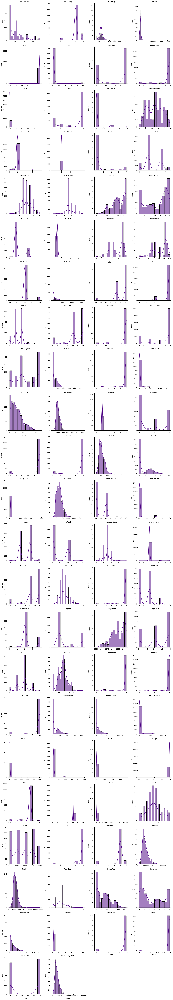

In [21]:
# Recheck for Skew on new Variables
df_cont =  df.select_dtypes(include=[np.number])
df_melt = df_cont.melt()
g = sns.FacetGrid(df_melt, col="variable", col_wrap=4, height=4, sharex=False, sharey=False)
g.map(sns.histplot, "value", color="indigo",kde=True,)
g.set_titles("{col_name}")
plt.show()

In [22]:
df_cont =  df.drop(columns=['SalePrice'])
for column in df_cont.columns:
   print(f'{column} skewness : {df_cont[column].skew():.2f}')

MSSubClass skewness : 1.41
MSZoning skewness : -1.74
LotFrontage skewness : 2.41
LotArea skewness : 12.21
Street skewness : -15.52
Alley skewness : 5.72
LotShape skewness : -0.61
LandContour skewness : -3.16
Utilities skewness : 38.21
LotConfig skewness : -1.14
LandSlope skewness : 4.81
Neighborhood skewness : 0.04
Condition1 skewness : 3.02
Condition2 skewness : 13.17
BldgType skewness : 2.25
HouseStyle skewness : 0.31
OverallQual skewness : 0.22
OverallCond skewness : 0.69
YearBuilt skewness : -0.61
YearRemodAdd skewness : -0.50
RoofStyle skewness : 1.47
RoofMatl skewness : 8.11
Exterior1st skewness : -0.73
Exterior2nd skewness : -0.69
MasVnrType skewness : 2.00
MasVnrArea skewness : 2.68
ExterQual skewness : -1.83
ExterCond skewness : -2.57
Foundation skewness : 0.09
BsmtQual skewness : -1.34
BsmtCond skewness : -3.46
BsmtExposure skewness : -1.19
BsmtFinType1 skewness : -0.06
BsmtFinSF1 skewness : 1.69
BsmtFinType2 skewness : -3.63
BsmtFinSF2 skewness : 4.26
BsmtUnfSF skewness : 0.

In [23]:
def log_transform(x):
    return np.log(x + 1)

skew_col = []
for col in df_cont.columns:
    if abs(df_cont[col].skew()) > 0.75:
        skew_col.append(col)
        
for col in skew_col:
    df[col] = FunctionTransformer(log_transform).fit_transform(df[col]) #log transform

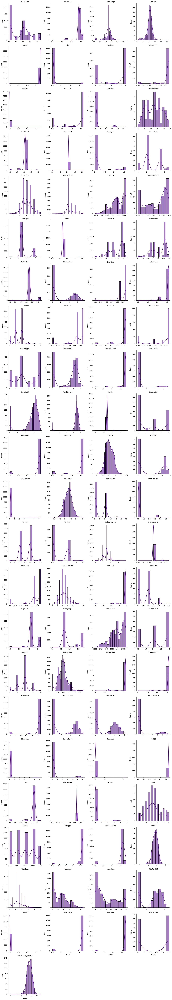

In [24]:
# Recheck for Skew on new Variables
df_cont =  df.drop(columns=['SalePrice'])
df_melt = df_cont.melt()
g = sns.FacetGrid(df_melt, col="variable", col_wrap=4, height=4, sharex=False, sharey=False)
g.map(sns.histplot, "value", color="indigo",kde=True,)
g.set_titles("{col_name}")
plt.show()

### Feature Selection

Text(0.5, 1.0, 'Correlation Heatmap of Data')

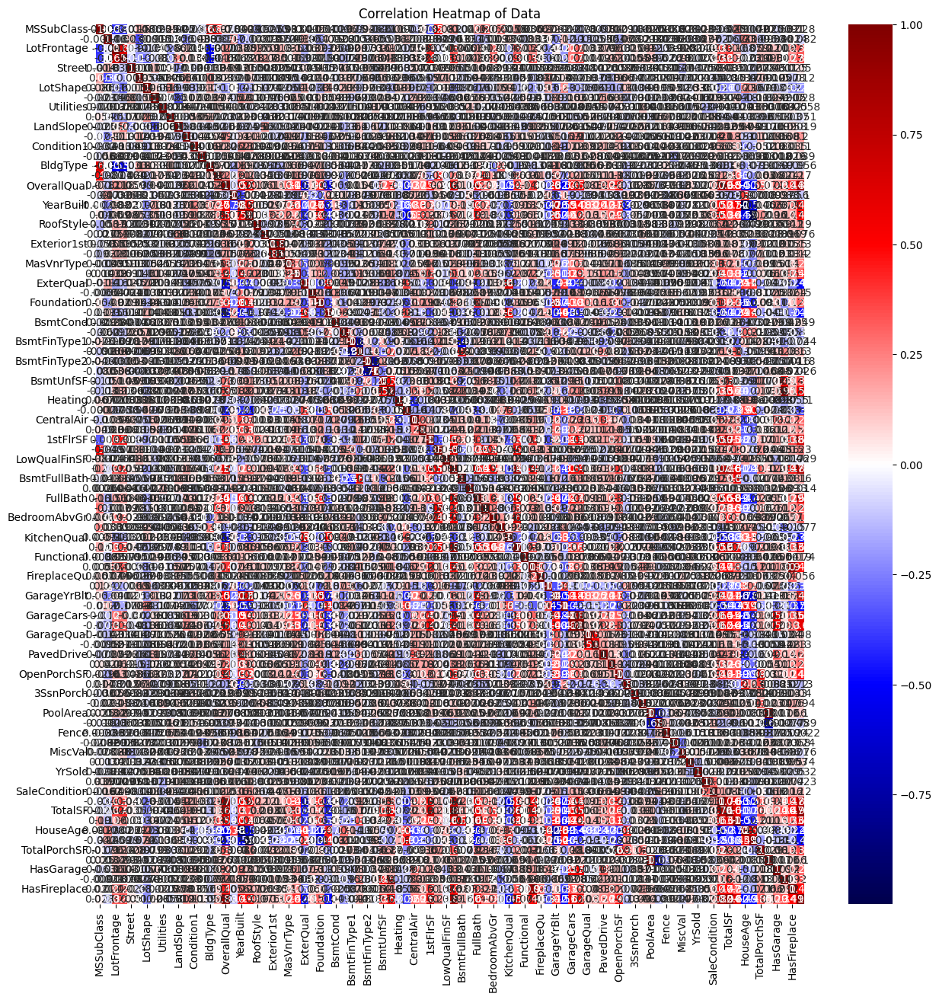

In [25]:
plt.figure(figsize=(15,15))
sns.heatmap(df.corr(method='pearson'),annot=True,cmap='seismic')
plt.title('Correlation Heatmap of Data')

Text(0.5, 1.0, 'Correlation to SalePrice Variable')

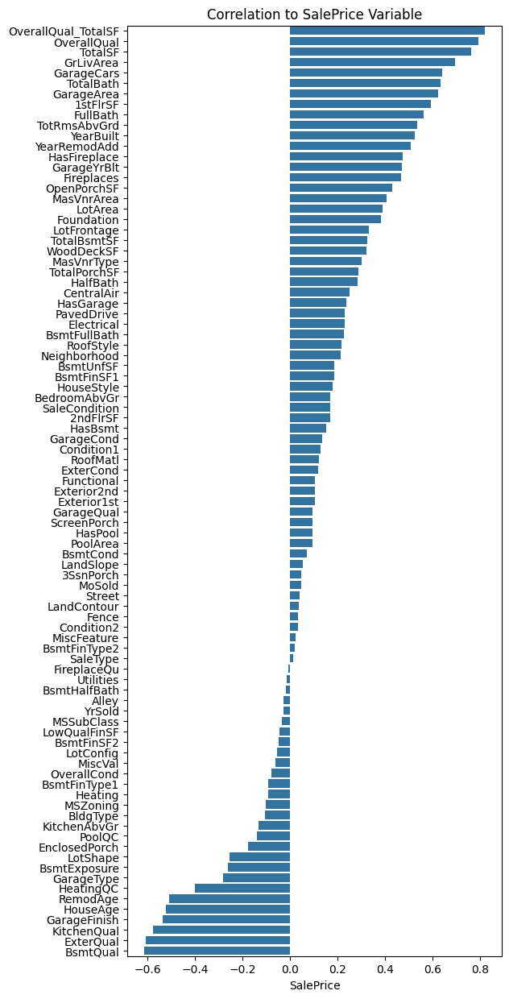

In [26]:
plt.figure(figsize=(6,15))
sns.barplot(df.corr(method='pearson')['SalePrice'].drop('SalePrice').sort_values(ascending=False),orient = 'h')
plt.title('Correlation to SalePrice Variable')


In [27]:
col_to_drop = []
for col, v in df.corr(method='pearson')['SalePrice'].items():
    if -0.2 < v < 0.2:
        col_to_drop.append(col)
        print(col)
        
df.drop(columns=col_to_drop,inplace=True)

MSSubClass
MSZoning
Street
Alley
LandContour
Utilities
LotConfig
LandSlope
Condition1
Condition2
BldgType
HouseStyle
OverallCond
RoofMatl
Exterior1st
Exterior2nd
ExterCond
BsmtCond
BsmtFinType1
BsmtFinSF1
BsmtFinType2
BsmtFinSF2
BsmtUnfSF
Heating
2ndFlrSF
LowQualFinSF
BsmtHalfBath
BedroomAbvGr
KitchenAbvGr
Functional
FireplaceQu
GarageQual
GarageCond
EnclosedPorch
3SsnPorch
ScreenPorch
PoolArea
PoolQC
Fence
MiscFeature
MiscVal
MoSold
YrSold
SaleType
SaleCondition
HasPool
HasBsmt


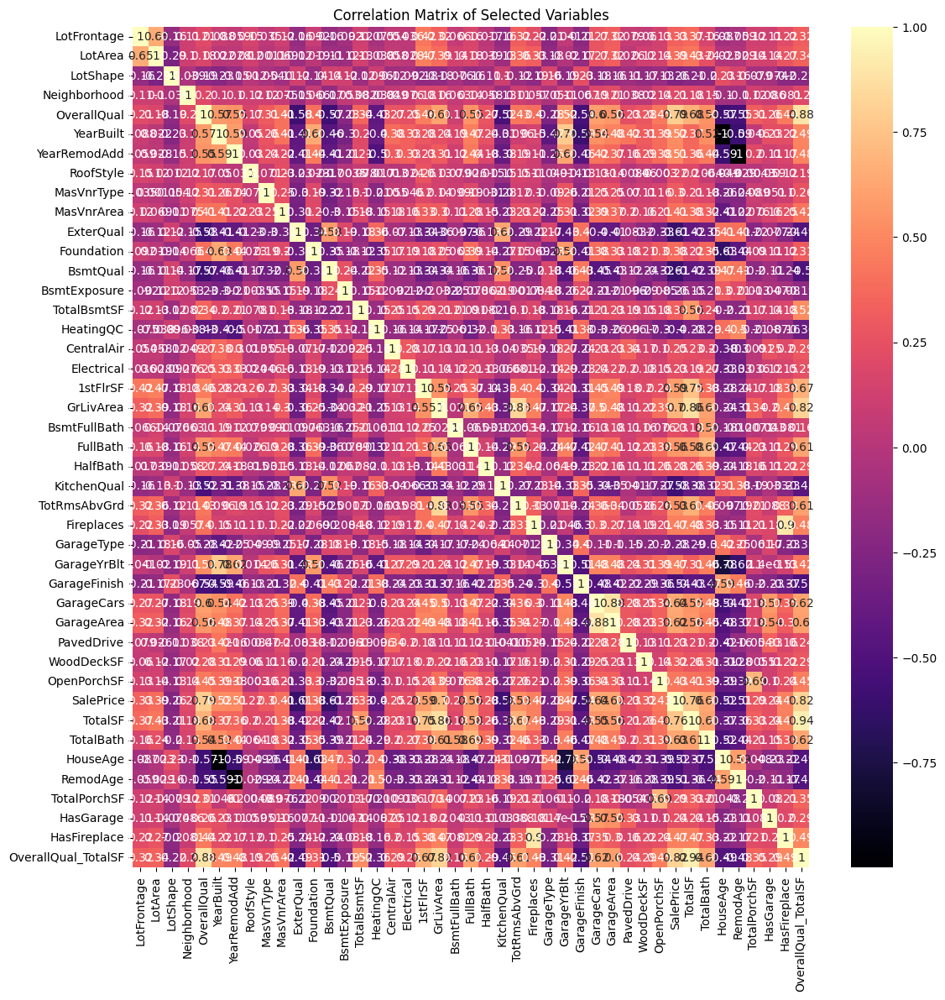

In [28]:
plt.figure(figsize=(13,13))
plt.title('Correlation Matrix of Selected Variables')
sns.heatmap(df.corr(method='pearson'),annot=True,cmap='magma')
plt.show()

## Modelling

### Cross-Validation

In [29]:
X = df.drop('SalePrice',axis=1)
X.head(3)

,LotFrontage,LotArea,LotShape,Neighborhood,OverallQual,YearBuilt,YearRemodAdd,RoofStyle,MasVnrType,MasVnrArea,...,WoodDeckSF,OpenPorchSF,TotalSF,TotalBath,HouseAge,RemodAge,TotalPorchSF,HasGarage,HasFireplace,OverallQual_TotalSF
0,4.189655,9.042040,3,5,7,2003,2003,0.693147,0.693147,5.283204,...,0.000000,4.127134,7.850493,3.5,5,5,4.127134,0.693147,0,9.796069
1,4.394449,9.169623,3,24,6,1976,1976,0.693147,0.693147,0.000000,...,5.700444,0.000000,7.833996,2.5,31,31,0.000000,0.693147,1,9.625426
2,4.234107,9.328212,0,5,7,2001,2002,0.693147,0.693147,5.093750,...,0.000000,3.761200,7.903596,3.5,7,6,3.761200,0.693147,1,9.849190


In [30]:
y = df['SalePrice']
y.head(3)

0    208500
1    181500
2    223500
Name: SalePrice, dtype: int64

In [31]:
from sklearn.pipeline import Pipeline
#Standardising Pipeline
reg_pipe = Pipeline([
    ('scaler', StandardScaler())
])

In [32]:
from sklearn.model_selection import train_test_split

X_train,X_test,y_train, y_test = train_test_split(X,y,shuffle=True,random_state=42,test_size=0.25)
print(f'X shape: {X_train.shape},{X_test.shape}')
print(f'y shape: {y_train.shape},{y_test.shape}')

X shape: (1095, 42),(365, 42)
y shape: (1095,),(365,)


In [33]:
X_train_scaled = reg_pipe.fit_transform(X_train)
X_test_scaled = reg_pipe.transform(X_test)

y_train_scaled = reg_pipe.fit_transform(y_train.values.reshape(-1,1))
y_test_scaled = reg_pipe.transform(y_test.values.reshape(-1,1))

### Model Training

#### Linear Regression

In [34]:
from sklearn.linear_model import LinearRegression
lr = LinearRegression()
lr.fit(X_train_scaled, y_train_scaled)

,fit_intercept,True
,copy_X,True
,tol,1e-06
,n_jobs,None
,positive,False


In [35]:
lr.coef_

array([[-0.03540655,  0.1324426 , -0.02007595,  0.01635865,  0.67550345,
        -0.00807788, -0.01485451,  0.02938365,  0.01430177, -0.01429953,
        -0.0420817 ,  0.0142232 , -0.09999063, -0.03139036, -0.04215179,
        -0.00963259,  0.04618225,  0.00446255,  0.00274795,  0.04201087,
         0.03798101,  0.00368645,  0.02786441, -0.08725082,  0.02450578,
         0.06648375,  0.01483731, -0.03782025, -0.00875544,  0.09922837,
         0.02641497,  0.02840182,  0.01330467,  0.00452148,  0.74530898,
         0.04579485, -0.0429228 , -0.06052599, -0.00597537, -0.03946819,
        -0.01153226, -0.85856906]])

In [36]:
y_pred = lr.predict(X_test_scaled)

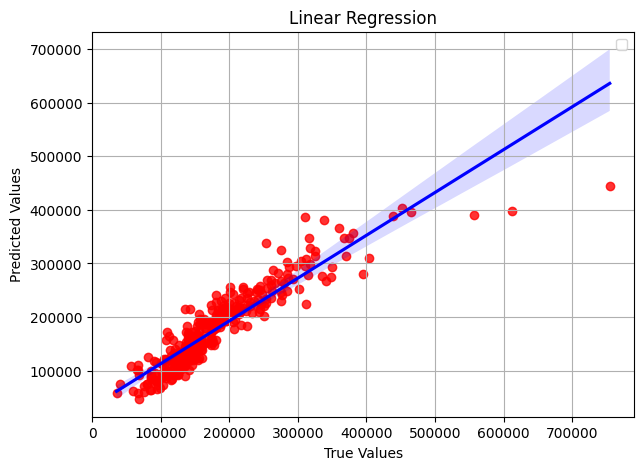

In [37]:
plt.figure(figsize=(7,5))
plt.grid()
sns.regplot(x=reg_pipe.inverse_transform(y_test_scaled), y=reg_pipe.inverse_transform(y_pred),scatter_kws={'color': 'r'},
            line_kws={'color': 'b'})
plt.legend()
plt.xlabel('True Values')
plt.ylabel('Predicted Values')
plt.title('Linear Regression')
plt.show()

In [38]:
print('Feature Coeffcients')
for column, coef in zip(X.columns, lr.coef_[0]):
    print(f'{column:<20} : {coef:.5f}')

print(f'Intercept : {lr.intercept_[0]:.15f}')

Feature Coeffcients
LotFrontage          : -0.03541
LotArea              : 0.13244
LotShape             : -0.02008
Neighborhood         : 0.01636
OverallQual          : 0.67550
YearBuilt            : -0.00808
YearRemodAdd         : -0.01485
RoofStyle            : 0.02938
MasVnrType           : 0.01430
MasVnrArea           : -0.01430
ExterQual            : -0.04208
Foundation           : 0.01422
BsmtQual             : -0.09999
BsmtExposure         : -0.03139
TotalBsmtSF          : -0.04215
HeatingQC            : -0.00963
CentralAir           : 0.04618
Electrical           : 0.00446
1stFlrSF             : 0.00275
GrLivArea            : 0.04201
BsmtFullBath         : 0.03798
FullBath             : 0.00369
HalfBath             : 0.02786
KitchenQual          : -0.08725
TotRmsAbvGrd         : 0.02451
Fireplaces           : 0.06648
GarageType           : 0.01484
GarageYrBlt          : -0.03782
GarageFinish         : -0.00876
GarageCars           : 0.09923
GarageArea           : 0.02641
PavedD

In [39]:
print("Intercept")
print(f"{lr.intercept_}")

Intercept
[-4.29522782e-16]


#### Random Forest Regressor

In [40]:
from sklearn.ensemble import RandomForestRegressor
rfr = RandomForestRegressor()
rfr.fit(X_train,y_train)

,n_estimators,100
,criterion,'squared_error'
,max_depth,None
,min_samples_split,2
,min_samples_leaf,1
,min_weight_fraction_leaf,0.0
,max_features,1.0
,max_leaf_nodes,None
,min_impurity_decrease,0.0
,bootstrap,True
,oob_score,False


In [41]:
y_pred = rfr.predict(X_test)

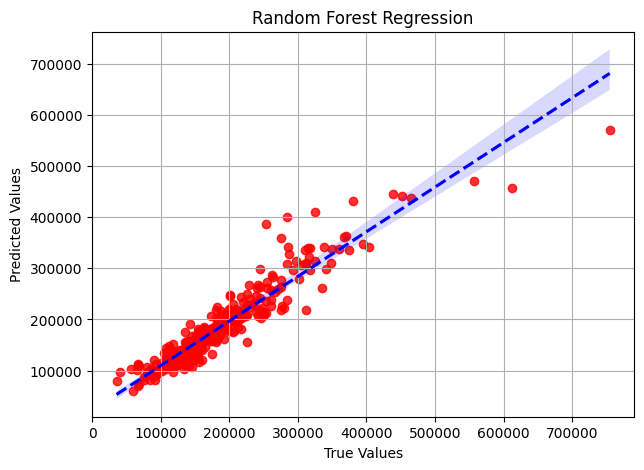

In [42]:
plt.figure(figsize=(7,5))
plt.grid()
sns.regplot(x=y_test, y=y_pred, scatter_kws={'color': 'r'},
            line_kws={'color': 'b','linestyle':"--"})
plt.xlabel('True Values')
plt.ylabel('Predicted Values')
plt.title('Random Forest Regression')
plt.show()

#### LightGBM

In [43]:
from lightgbm import LGBMRegressor
lgbmr = LGBMRegressor(verbose=0)
lgbmr.fit(X_train,y_train,eval_set=[(X_test, y_test), (X_train, y_train)])

,boosting_type,'gbdt'
,num_leaves,31
,max_depth,-1
,learning_rate,0.1
,n_estimators,100
,subsample_for_bin,200000
,objective,None
,class_weight,None
,min_split_gain,0.0
,min_child_weight,0.001
,min_child_samples,20


In [44]:
y_pred = lgbmr.predict(X_test)

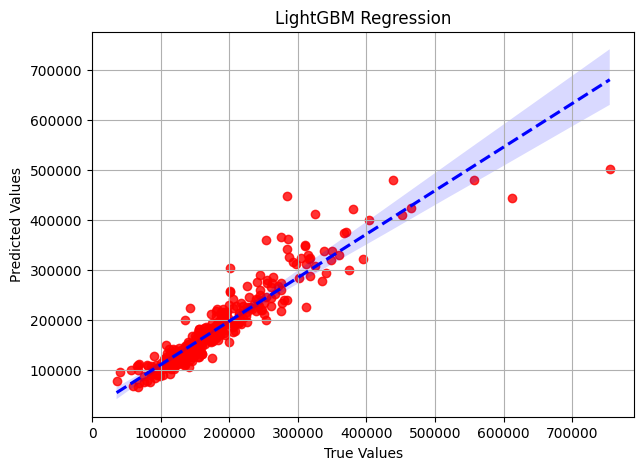

In [45]:
plt.figure(figsize=(7,5))
plt.grid()
sns.regplot(x=y_test, y=y_pred, scatter_kws={'color': 'r'},
            line_kws={'color': 'b','linestyle':"--"})
plt.xlabel('True Values')
plt.ylabel('Predicted Values')
plt.title('LightGBM Regression')
plt.show()

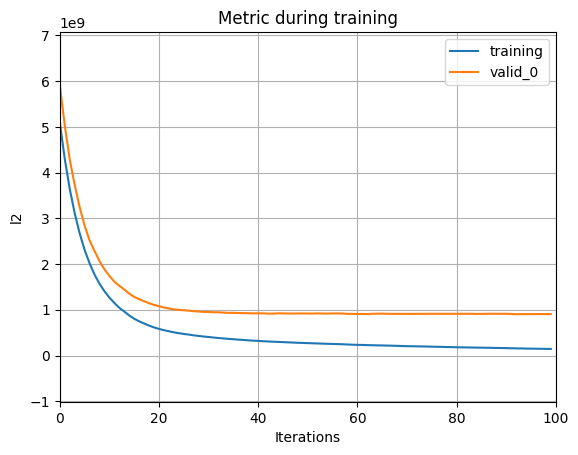

In [46]:
import lightgbm as lgb
lgb.plot_metric(lgbmr)
plt.show()

#### XGBoost

In [47]:
from xgboost import XGBRegressor
xgbr = XGBRegressor()
xgbr.fit(X_train,y_train)

,objective,'reg:squarederror'
,base_score,None
,booster,None
,callbacks,None
,colsample_bylevel,None
,colsample_bynode,None
,colsample_bytree,None
,device,None
,early_stopping_rounds,None
,enable_categorical,False
,eval_metric,None


In [48]:
y_pred = xgbr.predict(X_test)

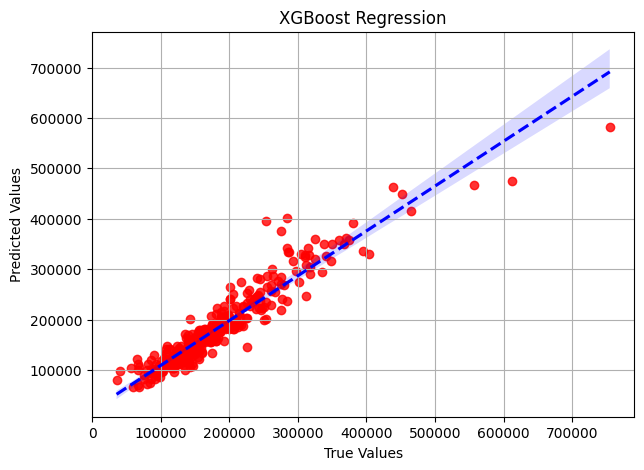

In [49]:
plt.figure(figsize=(7,5))
plt.grid()
sns.regplot(x=y_test, y=y_pred, scatter_kws={'color': 'r'},
            line_kws={'color': 'b','linestyle':"--"})
plt.xlabel('True Values')
plt.ylabel('Predicted Values')
plt.title('XGBoost Regression')
plt.show()

#### CatBoost

In [50]:
from catboost import CatBoostRegressor
cbr = CatBoostRegressor(verbose=0)
cbr.fit(X_train,y_train)

In [51]:
y_pred = cbr.predict(X_test)

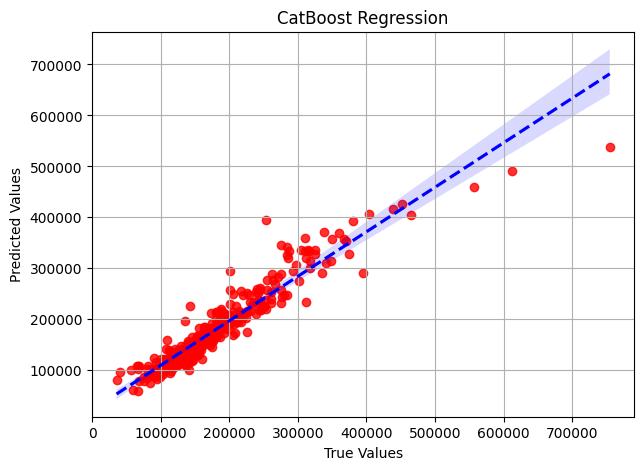

In [52]:
plt.figure(figsize=(7,5))
plt.grid()
sns.regplot(x=y_test, y=y_pred, scatter_kws={'color': 'r'},
            line_kws={'color': 'b','linestyle':"--"})
plt.xlabel('True Values')
plt.ylabel('Predicted Values')
plt.title('CatBoost Regression')
plt.show()

## Evaluation

#####  Formulas
- MAE - Mean Absolute Error $$\sum_{i=1}^{D}|x_i-y_i|$$
- MSE - Mean Square Error $$\sum_{i=1}^{D}(x_i-y_i)^2$$
- RMSE - Root Mean Square Error $$\sqrt{\sum_{i=1}^{D}(x_i-y_i)^2}$$
- R^2 - $$R^2 = 1 - \frac{\text{sum squared regression (SSR)}}{\text{total sum of squares (SST)}}, \\= 1 - \frac{\sum \left( y_i - \hat{y}_i \right)^2}{\sum \left( y_i - \bar{y} \right)^2}$$
- Adjusted R^2 - $$R^2_{\text{adj}} = 1 - \left( \frac{(1 - R^2)(n - 1)}{n - p - 1} \right)$$

In [53]:
from sklearn.model_selection import cross_val_score, KFold
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score,make_scorer


kf = KFold(n_splits=4, shuffle=True, random_state=42)
count = 1
for X_indexes , y_indexes in kf.split(X, y):
    print(f'Fold {count}, X : {len(X_indexes)}, y : {len(y_indexes)}')
    count += 1

Fold 1, X : 1095, y : 365
Fold 2, X : 1095, y : 365
Fold 3, X : 1095, y : 365
Fold 4, X : 1095, y : 365


In [54]:
def adj_r2_score(y_true,y_pred):
    r2 = r2_score(y_true,y_pred)
    n = len(X_train)
    p = X_train.shape[1]
    return 1 - (((1-r2)*(n-1))/(n-p-1))

In [55]:
kf = KFold(n_splits=4, shuffle=True, random_state=42)

def evaluate_scores(X,y,model,verbose=0,print=True):
    if print:
        print('Cross Validation for 4 Folds per Metric')

    scaler_X = StandardScaler()
    X_eval = scaler_X.fit_transform(X)

    scaler_y = StandardScaler()
    y_eval = scaler_y.fit_transform(y.values.reshape(-1,1))

    mse = cross_val_score(model,X_eval,y_eval,cv=kf,verbose=verbose,scoring="neg_mean_squared_error")
    rmse = cross_val_score(model,X_eval,y_eval,cv=kf,verbose=verbose,scoring="neg_root_mean_squared_error")
    mae = cross_val_score(model,X_eval,y_eval,cv=kf,verbose=verbose,scoring="neg_mean_absolute_error")
    r2 = cross_val_score(model,X_eval,y_eval,cv=kf,verbose=verbose,scoring="r2")
    adj_r2 = cross_val_score(model,X_eval,y_eval,cv=kf,verbose=verbose,scoring=make_scorer(adj_r2_score))

    if print:
        print('-'*10)
        print(f'Mean Squared Error : {np.mean(-mse):.4f}')
        print(f'Root Mean Squared Error : {np.mean(-rmse):.4f}')
        print(f'Mean Absolute Error : {np.mean(-mae):.4f}')
        print(f'R^2 :{ np.mean(r2):.4f}')
        print(f'Adjusted R^2 :{ np.mean(adj_r2):.4f}')
        print('-'*10)
        return None

    return type(model).__name__,np.mean(-mse),np.mean(-rmse),np.mean(-mae),np.mean(r2),np.mean(adj_r2)
    

In [56]:
def eval_overfit_check(model, X_train, y_train, X_test, y_test):
    train_pred = model.predict(X_train)
    test_pred = model.predict(X_test)
    print(type(model).__name__)

    print('Training Set Evaluation:')
    print(f'Mean Squared Error (Train): {mean_squared_error(y_train, train_pred):.4f}')
    print(f'Mean Absolute Error (Train): {mean_absolute_error(y_train, train_pred):.4f}')
    print(f'Root Mean Squared Error (Train): {np.sqrt(mean_squared_error(y_train, train_pred)):.4f}')
    print(f'R2 Score (Train): {r2_score(y_train, train_pred):.4f}')

    print('\nTest Set Evaluation:')
    print(f'Mean Squared Error (Test): {mean_squared_error(y_test, test_pred):.4f}')
    print(f'Mean Absolute Error (Test): {mean_absolute_error(y_test, test_pred):.4f}')
    print(f'Root Mean Squared Error (Test): {np.sqrt(mean_squared_error(y_test, test_pred)):.4f}')
    print(f'R2 Score (Test): {r2_score(y_test, test_pred):.4f}')

In [57]:
df_metrics = pd.DataFrame(columns=['model','mse','rmse','mae','r2','adj_r2'])

In [58]:
df_metrics.loc[0] = evaluate_scores(X,y,lr,print=False)
df_metrics.loc[1] = evaluate_scores(X,y,rfr,print=False)
df_metrics.loc[2] = evaluate_scores(X,y,lgbmr,print=False)
df_metrics.loc[3] = evaluate_scores(X,y,xgbr,print=False)
df_metrics.loc[4] = evaluate_scores(X,y,cbr,print=False)

In [59]:
df_metrics

,model,mse,rmse,mae,r2,adj_r2
0,LinearRegression,0.182718,0.424635,0.265524,0.817753,0.810477
1,RandomForestRegressor,0.133560,0.366548,0.224381,0.863737,0.858801
2,LGBMRegressor,0.138612,0.371179,0.221568,0.861461,0.855930
3,XGBRegressor,0.121352,0.348042,0.225011,0.877422,0.872529
4,CatBoostRegressor,0.107940,0.326914,0.200522,0.892235,0.887932


##### Overfit/Underfit Checking

In [60]:
eval_overfit_check(lr,X_train_scaled,y_train_scaled,X_test_scaled,y_test_scaled)

LinearRegression
Training Set Evaluation:
Mean Squared Error (Train): 0.1749
Mean Absolute Error (Train): 0.2606
Root Mean Squared Error (Train): 0.4182
R2 Score (Train): 0.8251

Test Set Evaluation:
Mean Squared Error (Test): 0.1853
Mean Absolute Error (Test): 0.2676
Root Mean Squared Error (Test): 0.4305
R2 Score (Test): 0.8394


In [61]:
eval_overfit_check(rfr,X_train,y_train,X_test,y_test)

RandomForestRegressor
Training Set Evaluation:
Mean Squared Error (Train): 134818806.5906
Mean Absolute Error (Train): 6685.9713
Root Mean Squared Error (Train): 11611.1501
R2 Score (Train): 0.9778

Test Set Evaluation:
Mean Squared Error (Test): 730849178.7280
Mean Absolute Error (Test): 16990.9445
Root Mean Squared Error (Test): 27034.2224
R2 Score (Test): 0.8957


In [62]:
eval_overfit_check(lgbmr,X_train,y_train,X_test,y_test)

LGBMRegressor
Training Set Evaluation:
Mean Squared Error (Train): 143930976.8939
Mean Absolute Error (Train): 5850.5187
Root Mean Squared Error (Train): 11997.1237
R2 Score (Train): 0.9763

Test Set Evaluation:
Mean Squared Error (Test): 905176357.3827
Mean Absolute Error (Test): 18040.0605
Root Mean Squared Error (Test): 30086.1489
R2 Score (Test): 0.8708


In [63]:
eval_overfit_check(xgbr,X_train,y_train,X_test,y_test)

XGBRegressor
Training Set Evaluation:
Mean Squared Error (Train): 687262.0625
Mean Absolute Error (Train): 571.3445
Root Mean Squared Error (Train): 829.0127
R2 Score (Train): 0.9999

Test Set Evaluation:
Mean Squared Error (Test): 716085184.0000
Mean Absolute Error (Test): 17309.2305
Root Mean Squared Error (Test): 26759.7680
R2 Score (Test): 0.8978


In [64]:
eval_overfit_check(cbr,X_train,y_train,X_test,y_test)

CatBoostRegressor
Training Set Evaluation:
Mean Squared Error (Train): 37334779.8626
Mean Absolute Error (Train): 4677.0874
Root Mean Squared Error (Train): 6110.2193
R2 Score (Train): 0.9939

Test Set Evaluation:
Mean Squared Error (Test): 690982398.7056
Mean Absolute Error (Test): 16336.2773
Root Mean Squared Error (Test): 26286.5441
R2 Score (Test): 0.9014


- Documentation : https://scikit-learn.org/stable/modules/learning_curve.html
- Reasoning : https://towardsdatascience.com/learning-curve-to-identify-overfitting-underfitting-problems-133177f38df5

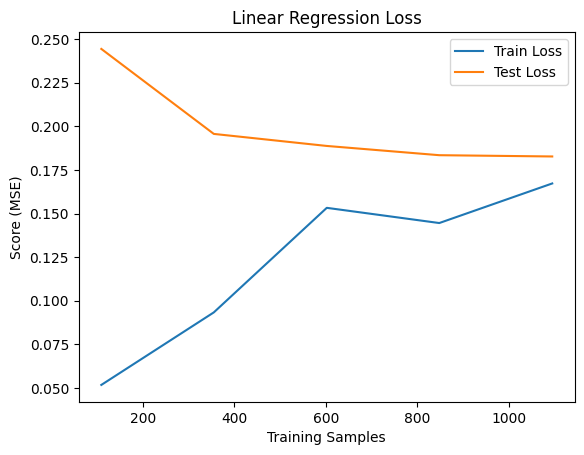

In [65]:
from sklearn.model_selection import learning_curve
scaler_x = StandardScaler()
scaler_y = StandardScaler()
X_scaled = scaler_x.fit_transform(X)
y_scaled = scaler_y.fit_transform(y.values.reshape(-1,1))

sample_size, train_scores, test_scores = learning_curve(lr, X_scaled, y_scaled, cv=kf, scoring='neg_mean_squared_error')
train_scores_mean = np.mean(-train_scores, axis=1)
test_scores_mean = np.mean(-test_scores, axis=1)

plt.plot(sample_size, train_scores_mean, label='Train Loss')
plt.plot(sample_size, test_scores_mean, label='Test Loss')
plt.xlabel('Training Samples')
plt.ylabel('Score (MSE)')
plt.title('Linear Regression Loss')
plt.legend()
plt.show()


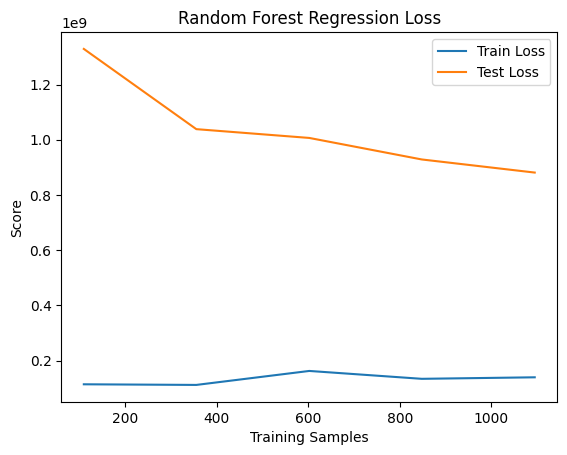

In [66]:

sample_size, train_scores, test_scores = learning_curve(rfr, X, y, cv=kf, scoring='neg_mean_squared_error')
train_scores_mean = np.mean(-train_scores, axis=1)
test_scores_mean = np.mean(-test_scores, axis=1)

plt.plot(sample_size, train_scores_mean, label='Train Loss')
plt.plot(sample_size, test_scores_mean, label='Test Loss')
plt.xlabel('Training Samples')
plt.ylabel('Score')
plt.title('Random Forest Regression Loss')
plt.legend()
plt.show()


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

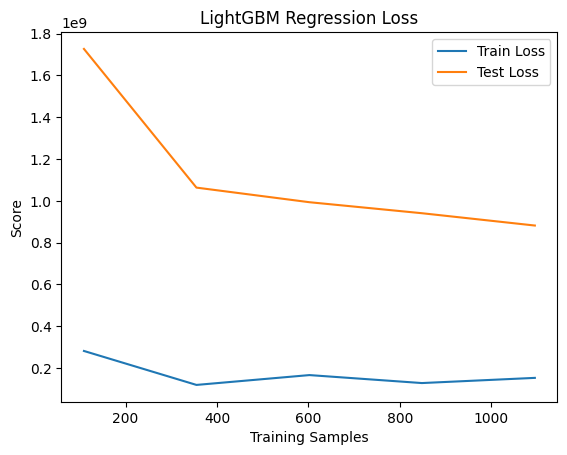

In [67]:

sample_size, train_scores, test_scores = learning_curve(lgbmr, X, y, cv=kf, scoring='neg_mean_squared_error')
train_scores_mean = np.mean(-train_scores, axis=1)
test_scores_mean = np.mean(-test_scores, axis=1)

plt.plot(sample_size, train_scores_mean, label='Train Loss')
plt.plot(sample_size, test_scores_mean, label='Test Loss')
plt.xlabel('Training Samples')
plt.ylabel('Score')
plt.title('LightGBM Regression Loss')
plt.legend()
plt.show()


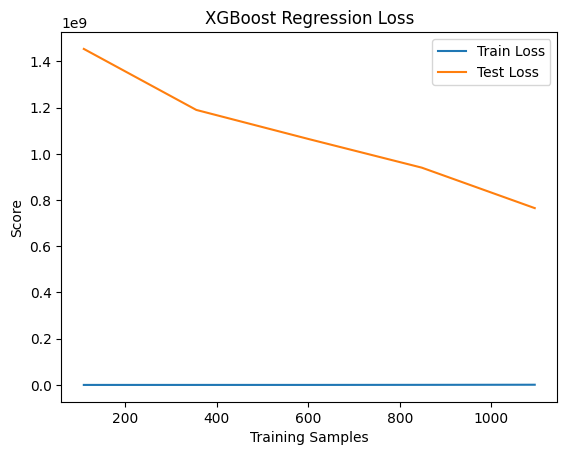

In [68]:
sample_size, train_scores, test_scores = learning_curve(xgbr, X, y, cv=kf, scoring='neg_mean_squared_error')
train_scores_mean = np.mean(-train_scores, axis=1)
test_scores_mean = np.mean(-test_scores, axis=1)

plt.plot(sample_size, train_scores_mean, label='Train Loss')
plt.plot(sample_size, test_scores_mean, label='Test Loss')
plt.xlabel('Training Samples')
plt.ylabel('Score')
plt.title('XGBoost Regression Loss')
plt.legend()
plt.show()

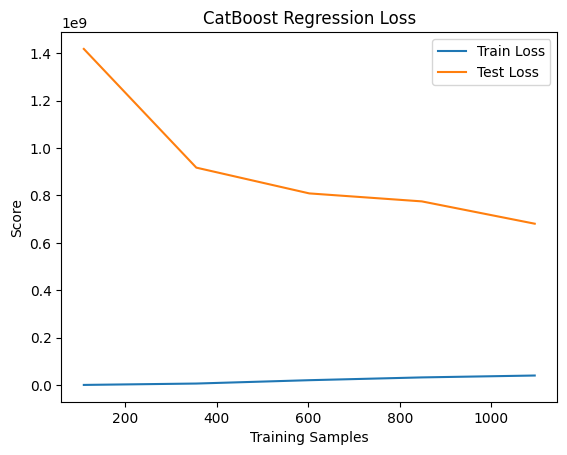

In [69]:
sample_size, train_scores, test_scores = learning_curve(cbr, X, y, cv=kf, scoring='neg_mean_squared_error')
train_scores_mean = np.mean(-train_scores, axis=1)
test_scores_mean = np.mean(-test_scores, axis=1)

plt.plot(sample_size, train_scores_mean, label='Train Loss')
plt.plot(sample_size, test_scores_mean, label='Test Loss')
plt.xlabel('Training Samples')
plt.ylabel('Score')
plt.title('CatBoost Regression Loss')
plt.legend()
plt.show()

### Model Finetuning

- Linear Regression
- Random Forest
- LightGBM
- XGBoost
- CatBoost


##### Random Forest

In [70]:
from sklearn.model_selection import GridSearchCV

RF_param_grid = {
    'n_estimators': [100, 200],
    'max_depth': [None, 10],
    'min_samples_split': [2, 5],
}

RF_ft = GridSearchCV(RandomForestRegressor(),param_grid=RF_param_grid,cv=kf,scoring='neg_mean_squared_error',verbose=2,n_jobs=-1)
RF_ft.fit(X_train,y_train)

Fitting 4 folds for each of 8 candidates, totalling 32 fits


,estimator,RandomForestRegressor()
,param_grid,"{'max_depth': [None, 10], 'min_samples_split': [2, 5], 'n_estimators': [100, 200]}"
,scoring,'neg_mean_squared_error'
,n_jobs,-1
,refit,True
,cv,KFold(n_split... shuffle=True)
,verbose,2
,pre_dispatch,'2*n_jobs'
,error_score,nan
,return_train_score,False
,n_estimators,100


In [71]:
RF_ft.best_params_

{'max_depth': None, 'min_samples_split': 2, 'n_estimators': 100}

In [72]:
rfr_ft = RF_ft.best_estimator_
rfr_ft.fit(X_train,y_train)

,n_estimators,100
,criterion,'squared_error'
,max_depth,None
,min_samples_split,2
,min_samples_leaf,1
,min_weight_fraction_leaf,0.0
,max_features,1.0
,max_leaf_nodes,None
,min_impurity_decrease,0.0
,bootstrap,True
,oob_score,False


In [73]:
y_pred = rfr_ft.predict(X_test)

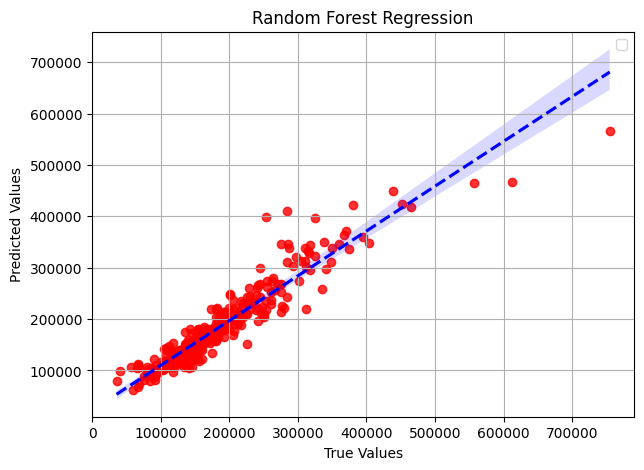

In [74]:
plt.figure(figsize=(7,5))
plt.grid()
sns.regplot(x=y_test, y=y_pred, scatter_kws={'color': 'r'},
            line_kws={'color': 'b','linestyle':'--'})
plt.legend()
plt.xlabel('True Values')
plt.ylabel('Predicted Values')
plt.title('Random Forest Regression')
plt.show()

##### LightGBM

In [75]:
LGBM_param_grid = {
    'num_leaves': [31, 127],
    'learning_rate': [0.01, 0.1],
    'n_estimators': [100, 200],
}

LGBM_ft = GridSearchCV(LGBMRegressor(verbose=-1),param_grid=LGBM_param_grid,cv=kf,scoring='neg_mean_squared_error',verbose=2,n_jobs=-1)
LGBM_ft.fit(X_train,y_train)

Fitting 4 folds for each of 8 candidates, totalling 32 fits


,estimator,LGBMRegressor(verbose=-1)
,param_grid,"{'learning_rate': [0.01, 0.1], 'n_estimators': [100, 200], 'num_leaves': [31, 127]}"
,scoring,'neg_mean_squared_error'
,n_jobs,-1
,refit,True
,cv,KFold(n_split... shuffle=True)
,verbose,2
,pre_dispatch,'2*n_jobs'
,error_score,nan
,return_train_score,False
,boosting_type,'gbdt'


In [76]:
LGBM_ft.best_params_

{'learning_rate': 0.1, 'n_estimators': 100, 'num_leaves': 127}

In [77]:
lgbmr_ft = LGBM_ft.best_estimator_
lgbmr_ft.fit(X_train,y_train)

,boosting_type,'gbdt'
,num_leaves,127
,max_depth,-1
,learning_rate,0.1
,n_estimators,100
,subsample_for_bin,200000
,objective,None
,class_weight,None
,min_split_gain,0.0
,min_child_weight,0.001
,min_child_samples,20


In [78]:
y_pred = lgbmr_ft.predict(X_test)

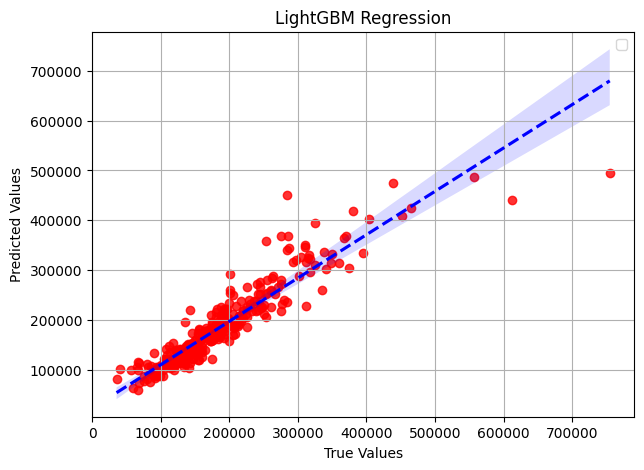

In [79]:
plt.figure(figsize=(7,5))
plt.grid()
sns.regplot(x=y_test, y=y_pred, scatter_kws={'color': 'r'},
            line_kws={'color': 'b','linestyle':'--'})
plt.legend()
plt.xlabel('True Values')
plt.ylabel('Predicted Values')
plt.title('LightGBM Regression')
plt.show()

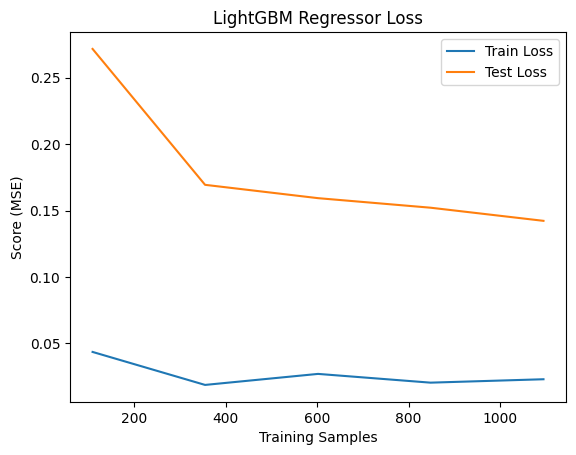

In [80]:
from sklearn.model_selection import learning_curve
scaler_x = StandardScaler()
scaler_y = StandardScaler()
X_scaled = scaler_x.fit_transform(X)
y_scaled = scaler_y.fit_transform(y.values.reshape(-1,1))

sample_size, train_scores, test_scores = learning_curve(lgbmr_ft, X_scaled, y_scaled, cv=kf, scoring='neg_mean_squared_error')
train_scores_mean = np.mean(-train_scores, axis=1)
test_scores_mean = np.mean(-test_scores, axis=1)

plt.plot(sample_size, train_scores_mean, label='Train Loss')
plt.plot(sample_size, test_scores_mean, label='Test Loss')
plt.xlabel('Training Samples')
plt.ylabel('Score (MSE)')
plt.title('LightGBM Regressor Loss')
plt.legend()
plt.show()


##### XGBoost

In [81]:
XGB_param_grid = {
    'max_depth': [3, 6],
    'learning_rate': [0.01, 0.1],
    'n_estimators': [100, 200],
}

XGB_ft = GridSearchCV(XGBRegressor(),param_grid=XGB_param_grid,cv=kf,scoring='neg_mean_squared_error',verbose=2,n_jobs=-1)
XGB_ft.fit(X_train,y_train)

Fitting 4 folds for each of 8 candidates, totalling 32 fits


,estimator,"XGBRegressor(...ree=None, ...)"
,param_grid,"{'learning_rate': [0.01, 0.1], 'max_depth': [3, 6], 'n_estimators': [100, 200]}"
,scoring,'neg_mean_squared_error'
,n_jobs,-1
,refit,True
,cv,KFold(n_split... shuffle=True)
,verbose,2
,pre_dispatch,'2*n_jobs'
,error_score,nan
,return_train_score,False
,objective,'reg:squarederror'


In [82]:
XGB_ft.best_params_

{'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 200}

In [83]:
xgbr_ft = XGB_ft.best_estimator_
xgbr_ft.fit(X_train,y_train)

,objective,'reg:squarederror'
,base_score,None
,booster,None
,callbacks,None
,colsample_bylevel,None
,colsample_bynode,None
,colsample_bytree,None
,device,None
,early_stopping_rounds,None
,enable_categorical,False
,eval_metric,None


In [84]:
y_pred = xgbr_ft.predict(X_test)

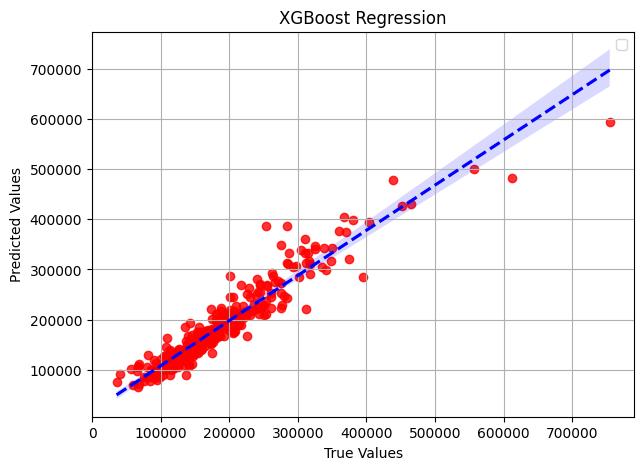

In [85]:
plt.figure(figsize=(7,5))
plt.grid()
sns.regplot(x=y_test, y=y_pred, scatter_kws={'color': 'r'},
            line_kws={'color': 'b','linestyle':'--'})
plt.legend()
plt.xlabel('True Values')
plt.ylabel('Predicted Values')
plt.title('XGBoost Regression')
plt.show()

##### CatBoost

In [86]:
CB_param_grid = {
    'depth': [6, 8],
    'learning_rate': [0.01, 0.1],
    'iterations': [100, 200],
}

CB_ft = GridSearchCV(CatBoostRegressor(verbose=0),param_grid=CB_param_grid,cv=kf,scoring='neg_mean_squared_error',verbose=2,n_jobs=-1)
CB_ft.fit(X_train,y_train)

Fitting 4 folds for each of 8 candidates, totalling 32 fits


,estimator,<catboost.cor...002EDAF7C7C80>
,param_grid,"{'depth': [6, 8], 'iterations': [100, 200], 'learning_rate': [0.01, 0.1]}"
,scoring,'neg_mean_squared_error'
,n_jobs,-1
,refit,True
,cv,KFold(n_split... shuffle=True)
,verbose,2
,pre_dispatch,'2*n_jobs'
,error_score,nan
,return_train_score,False


In [87]:
CB_ft.best_params_

{'depth': 6, 'iterations': 200, 'learning_rate': 0.1}

In [88]:
cbr_ft = CB_ft.best_estimator_
cbr_ft.fit(X_train,y_train)

In [89]:
y_pred = cbr_ft.predict(X_test)

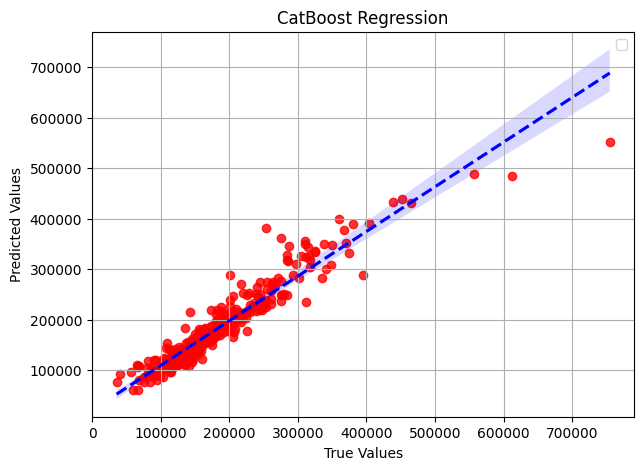

In [90]:
plt.figure(figsize=(7,5))
plt.grid()
sns.regplot(x=y_test, y=y_pred, scatter_kws={'color': 'r'},
            line_kws={'color': 'b','linestyle':'--'})
plt.legend()
plt.xlabel('True Values')
plt.ylabel('Predicted Values')
plt.title('CatBoost Regression')
plt.show()

In [91]:
df_metrics.loc[5] = evaluate_scores(X,y,rfr_ft,print=False)
df_metrics.loc[6] = evaluate_scores(X,y,lgbmr_ft,print=False)
df_metrics.loc[7] = evaluate_scores(X,y,xgbr_ft,print=False)
df_metrics.loc[8] = evaluate_scores(X,y,cbr_ft,print=False)

In [93]:
df_metrics.loc[5, 'model'] = "RandomForestRegressor Finetuned"
df_metrics.loc[6, 'model'] = "LGBMRegressor Finetuned"
df_metrics.loc[7, 'model'] = "XGBRegressor Finetuned"
df_metrics.loc[8, 'model'] = "CatBoostRegressor Finetuned"
df_metrics

,model,mse,rmse,mae,r2,adj_r2
0,LinearRegression,0.182718,0.424635,0.265524,0.817753,0.810477
1,RandomForestRegressor,0.133560,0.366548,0.224381,0.863737,0.858801
2,LGBMRegressor,0.138612,0.371179,0.221568,0.861461,0.855930
3,XGBRegressor,0.121352,0.348042,0.225011,0.877422,0.872529
4,CatBoostRegressor,0.107940,0.326914,0.200522,0.892235,0.887932
5,RandomForestRegressor Finetuned,0.137793,0.369837,0.225263,0.859816,0.856880
6,LGBMRegressor Finetuned,0.142244,0.376100,0.223586,0.857615,0.851930
7,XGBRegressor Finetuned,0.113134,0.334929,0.210757,0.886546,0.882017
8,CatBoostRegressor Finetuned,0.107868,0.327267,0.203521,0.892014,0.887703


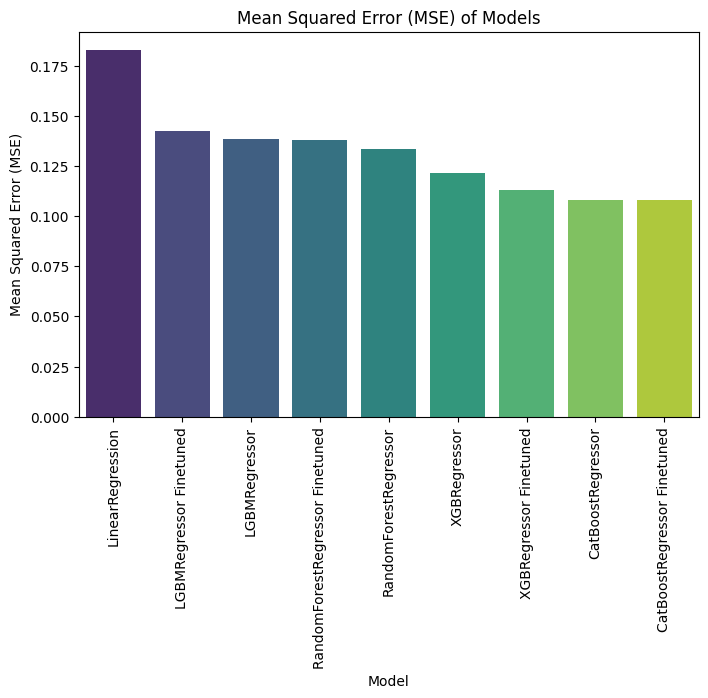

In [99]:
plt.figure(figsize=(8,5))
sns.barplot(data=df_metrics.sort_values(by='mse',ascending=False), x='model', y='mse', palette='viridis')
plt.title('Mean Squared Error (MSE) of Models')
plt.xlabel('Model')
plt.ylabel('Mean Squared Error (MSE)')
plt.xticks(rotation=90)  
plt.show()

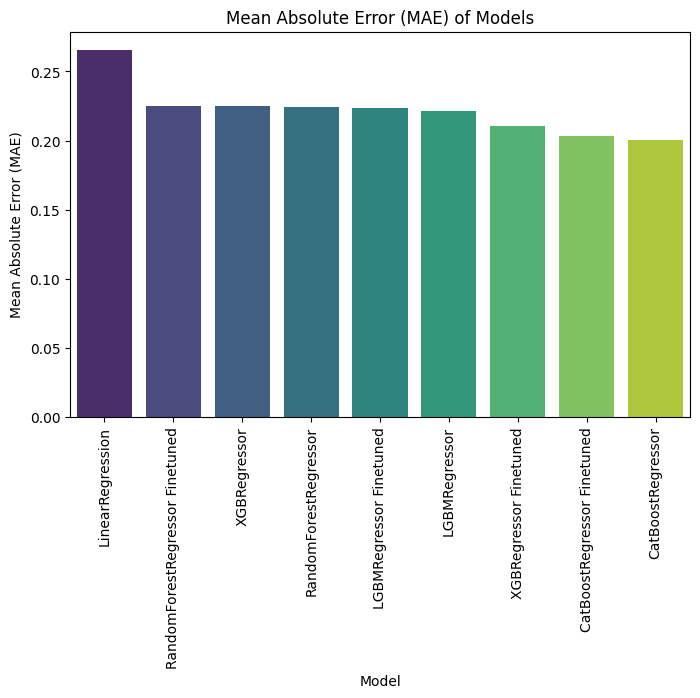

In [100]:
plt.figure(figsize=(8,5))
sns.barplot(data=df_metrics.sort_values(by='mae',ascending=False), x='model', y='mae', palette='viridis')
plt.title('Mean Absolute Error (MAE) of Models')
plt.xlabel('Model')
plt.ylabel('Mean Absolute Error (MAE)')
plt.xticks(rotation=90)  
plt.show()

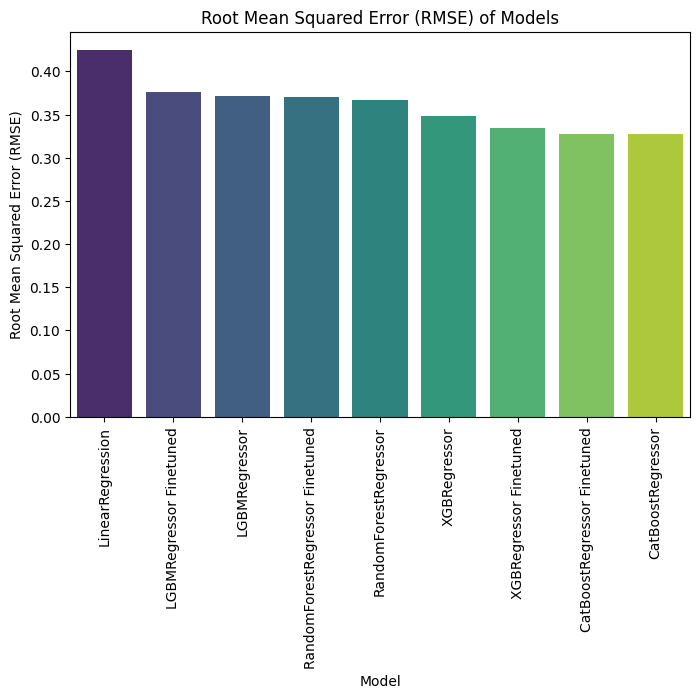

In [101]:
plt.figure(figsize=(8,5))
sns.barplot(data=df_metrics.sort_values(by='rmse', ascending=False), x='model', y='rmse', palette='viridis')
plt.title('Root Mean Squared Error (RMSE) of Models')
plt.xlabel('Model')
plt.ylabel('Root Mean Squared Error (RMSE)')
plt.xticks(rotation=90)
plt.show()

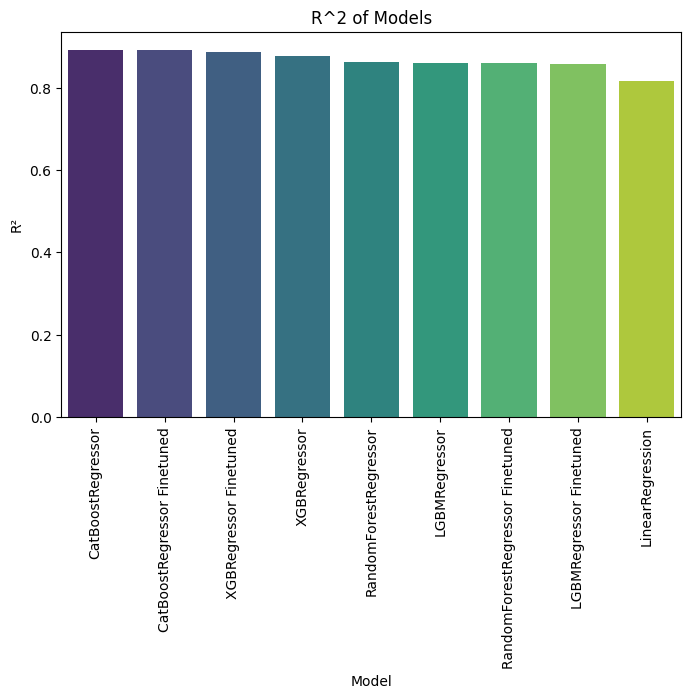

In [102]:
plt.figure(figsize=(8,5))
sns.barplot(data=df_metrics.sort_values(by='r2', ascending=False), x='model', y='r2', palette='viridis')
plt.title('R^2 of Models')
plt.xlabel('Model')
plt.ylabel('R²')
plt.xticks(rotation=90)
plt.show()

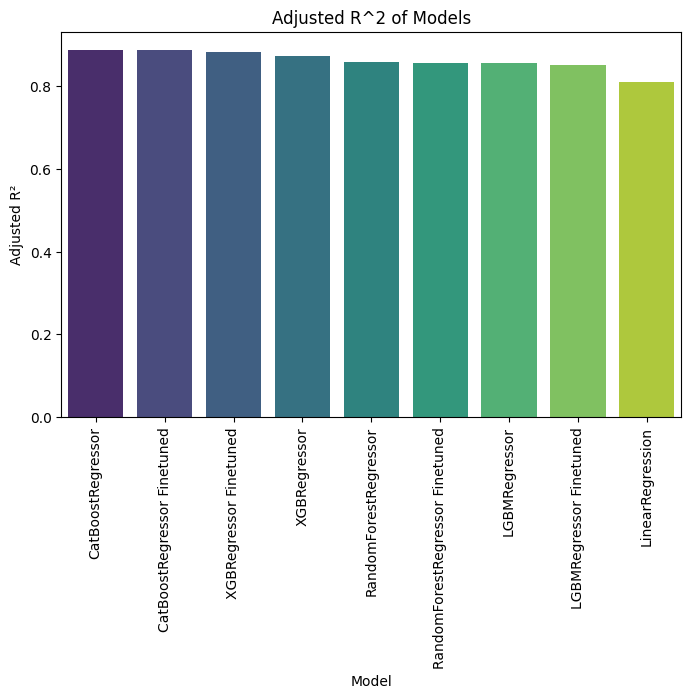

In [103]:
plt.figure(figsize=(8,5))
sns.barplot(data=df_metrics.sort_values(by='adj_r2', ascending=False), x='model', y='adj_r2', palette='viridis')
plt.title('Adjusted R^2 of Models')
plt.xlabel('Model')
plt.ylabel('Adjusted R²')
plt.xticks(rotation=90)
plt.show()